In [0]:
from google.colab import drive
drive.mount("/content/drive")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import os
import pandas as pd
import librosa
import numpy as np
import random
from tqdm import tqdm

In [0]:
os.chdir("/content/drive/My Drive/datasetss")
!ls

captions.npy	      images.npy	      unique.p	     word_in.json
flickr30k-images.tar  in_word.json	      vox1_meta.csv  Xwav.npy
Flickr_Data.zip       model_weights.h5	      vox_dev.zip
gender.npy	      next_words.npy	      wav_name.npy
image_names.npy       train_encoded_images.p  wav.npy


In [0]:
!unzip vox_dev.zip -d /content/

Archive:  vox_dev.zip
error: End-of-centdir-64 signature not where expected (prepended bytes?)
  (attempting to process anyway)
warning [vox_dev.zip]:  139078084 extra bytes at beginning or within zipfile
  (attempting to process anyway)
   creating: /content/wav/
   creating: /content/wav/id10092/
   creating: /content/wav/id10092/LbVIZMrQGmQ/
  inflating: /content/wav/id10092/LbVIZMrQGmQ/00001.wav  
  inflating: /content/wav/id10092/LbVIZMrQGmQ/00002.wav  
  inflating: /content/wav/id10092/LbVIZMrQGmQ/00003.wav  
   creating: /content/wav/id10092/9YDXIU5SmUo/
  inflating: /content/wav/id10092/9YDXIU5SmUo/00001.wav  
  inflating: /content/wav/id10092/9YDXIU5SmUo/00002.wav  
  inflating: /content/wav/id10092/9YDXIU5SmUo/00003.wav  
  inflating: /content/wav/id10092/9YDXIU5SmUo/00004.wav  
   creating: /content/wav/id10092/ifoQZ4hauRU/
  inflating: /content/wav/id10092/ifoQZ4hauRU/00001.wav  
  inflating: /content/wav/id10092/ifoQZ4hauRU/00002.wav  
  inflating: /content/wav/id10092/ifo

In [0]:
%cd /content/wav/

/content/wav


In [0]:
metadata = pd.read_csv("/content/drive/My Drive/datasetss/vox1_meta.csv", delimiter = "\t")

metadata.head()

,VoxCeleb1 ID,VGGFace1 ID,Gender,Nationality,Set
0,id10001,A.J._Buckley,m,Ireland,dev
1,id10002,A.R._Rahman,m,India,dev
2,id10003,Aamir_Khan,m,India,dev
3,id10004,Aaron_Tveit,m,USA,dev
4,id10005,Aaron_Yoo,m,USA,dev


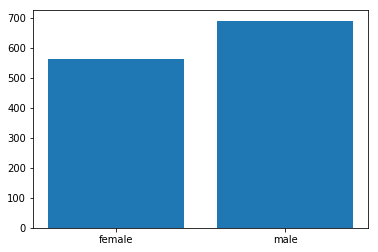

In [0]:
import matplotlib.pyplot as plt
gender= np.array(metadata.iloc[:,2])
plt.bar(['female',"male"],np.unique(gender,return_counts = True)[1])
plt.show()

In [0]:
np.unique(gender,return_counts = True)[1]

array([561, 690])

In [0]:
def adjust(stft):
  if stft.shape[1] == 601:
    return stft
  else:
    return np.concatenate((stft,stft[:,0:601 - stft.shape[1]]),axis = 1)

In [0]:
def power_law(data,power=0.3):
    # assume input has negative value
    mask = np.zeros(data.shape)
    mask[data>=0] = 1
    data = data*mask
    return data

In [0]:
os.chdir("/content/wav")
folder_name = os.listdir()
no_of_records = 3
X = np.zeros((len(folder_name) *  no_of_records,257,601,2),dtype = np.float32)
index = 0 
for folder in tqdm(folder_name):
  for i in range(no_of_records):
    
    path_ = os.path.join(folder,random.choice(os.listdir(folder)))
    file_path = os.path.join(path_,random.choice(os.listdir(path_)))
    wav_file , sr = librosa.load(file_path,sr = 16000, duration = 6.0 ,mono = True)
    
    stft_ = librosa.core.stft(wav_file, n_fft = 512, hop_length = int(np.ceil(0.01 * sr)),win_length = int(np.ceil(0.025 * sr)) , window='hann', center=True,pad_mode='reflect')
    
    stft = adjust(stft_)
    for j in range(stft.shape[0]):
      for k in range(stft.shape[1]):
        X[index,j,k,0] = stft[j,k].real
        X[index,j,k,1] = stft[j,k].imag

    index += 1
    
                                                              
                                                                      

100%|██████████| 1211/1211 [1:53:29<00:00,  5.58s/it]


In [0]:
X

array([[[[ 9.41240883e+00,  0.00000000e+00],
         [-2.50644565e+00,  0.00000000e+00],
         [ 3.79052806e+00,  0.00000000e+00],
         ...,
         [-2.25360131e+00,  0.00000000e+00],
         [-8.58565748e-01,  0.00000000e+00],
         [-3.15436697e+00,  0.00000000e+00]],

        [[-9.64635658e+00, -6.93889390e-16],
         [ 4.40581179e+00, -2.00145411e+00],
         [-4.54128218e+00,  1.26794708e+00],
         ...,
         [ 1.74836600e+00, -6.40781760e-01],
         [-1.69493273e-01,  7.80224442e-01],
         [ 3.77807331e+00,  6.06886446e-02]],

        [[ 6.16513634e+00,  1.28240269e-15],
         [-5.90086365e+00,  5.38515598e-02],
         [ 5.75602102e+00, -2.07299256e+00],
         ...,
         [-1.13257372e+00,  1.01523376e+00],
         [ 8.19380760e-01, -1.74774206e+00],
         [-4.20191813e+00, -1.01677164e-01]],

        ...,

        [[ 1.90555677e-02, -5.64623684e-18],
         [-1.54892933e-02,  3.28535922e-02],
         [-1.77862234e-02, -3.45532000

In [0]:
np.save("/content/drive/My Drive/wavXmel.npy",Xmel)

In [0]:
np.save("/content/drive/My Drive/filename.npy",np.array(os.listdir("/content/wav")))

In [0]:
os.chdir("/content/wav")
folder_name = os.listdir()
no_of_records = 3
Xmel = np.zeros((len(folder_name) *  no_of_records,128,601),dtype = np.float32)
index = 0 
for folder in tqdm(folder_name):
  for i in range(no_of_records):
    
    path_ = os.path.join(folder,random.choice(os.listdir(folder)))
    file_path = os.path.join(path_,random.choice(os.listdir(path_)))
    wav_file , sr = librosa.load(file_path,sr = 16000, duration = 6.0 ,mono = True)
    try:
      mel =  librosa.feature.melspectrogram(y=wav_file, sr=sr, n_fft = 1024)
      mel = adjust(mel)                                      
      Xmel[index] = mel
    except:
      pass
    index += 1

  1%|          | 15/1211 [01:02<1:23:33,  4.19s/it]

In [0]:
path_ = os.path.join('/content/wav/id10006',random.choice(os.listdir('id10006')))
file_path = os.path.join(path_,random.choice(os.listdir(path_)))
wav_file , sr = librosa.load(file_path,sr = 16000, duration = 6.0 ,mono = True)

mel =  librosa.feature.melspectrogram(y=wav_file, sr=sr, n_fft = 1024)
mel = adjust(mel)
mel

array([[4.41743202e-03, 4.75518515e-07, 1.94173366e-06, ...,
        9.87195361e-06, 5.26908939e-06, 2.56425674e-03],
       [5.93644073e-03, 5.18613922e-05, 8.84926830e-05, ...,
        2.41429072e-05, 4.24989722e-05, 2.86765695e-03],
       [4.97888335e-03, 4.04520702e-05, 6.97627035e-05, ...,
        3.09696955e-05, 6.58646878e-05, 2.11431987e-03],
       ...,
       [2.86059691e-06, 4.95139007e-06, 7.27067913e-06, ...,
        9.07271067e-06, 1.19627489e-05, 2.27760745e-06],
       [4.16735921e-06, 6.51476165e-06, 8.32819203e-06, ...,
        1.40500652e-05, 1.68324976e-05, 6.67479309e-07],
       [2.00447270e-06, 7.46663222e-06, 7.14230625e-06, ...,
        9.17327417e-06, 8.16379392e-06, 6.14006610e-07]])

In [0]:
mel.shape

(128, 344)

In [0]:
librosa.get_duration(wav_file)

3.9764625850340134

In [0]:
adjust(mel).shape

(128, 601)